# Extract and compare DEM elevation with ICESat-2 Points
1. Merge DEMs strips is more than 1
2. Extract Elevation for DEM
3. Note the time and time-difference between acquisition of ICESat-2, DEM imagery, and whether DEM is created from along-track or cross-track imageries

Sept 02, 2022  

In [1]:
%matplotlib inline

In [2]:
import os
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

import numpy as np
import pandas as pd
from shapely.geometry import Polygon, Point
import geopandas as gpd
import xarray as xr
import rioxarray

import hvplot
import geoviews as gv
import hvplot.pandas
import hvplot.xarray
from cartopy import crs as ccrs

In [3]:
# Choose Icesat-2 Product
short_name = 'ATL06'

# Setup data paths
region = 'arcticdem_02_greenland_southeast'#'old prefix region replaced by arcticdem'
dir_prefix = '/fs/byo/howat-data5' #data4, 5 'D:' 'V:' '/fs/byo/howat-data4' #'/fs/project/howat.4' #/REMA/region_20_ross_shelf
dem_type = ['REMA', 'ArcticDEM', 'EarthDEM']
dem_type = dem_type[1] # MUST CHOOSE
# Here we will start to ICESat-2 because all of these have corresponding DEM folder
base_icesat2_path = f'/fs/project/howat.4/icesat2/{dem_type}/{region}_{short_name}' # Set the icesat2_path : where ICESat-2 files are staged
strips = os.listdir(base_icesat2_path)
# Select a particular satellite, WV03 for example
# strips = [strip for strip in strips if strip.startswith('WV03')]
len(strips)

4124

In [4]:
# NB: Strips for merging vertically
# strip = strips[-2], ie: 'WV01_20191023_102001008DDFC500_102001008A969D00_2m_lsf_v040101' for region_02_greenland_southeast

In [8]:
# fig_folder = '/home/yadav.111/figs_icesat/ATL06'
analysis_folder = f'/fs/project/howat.4/icesat2/prototyping/analysis/{dem_type}/{region}'
if not os.path.exists(analysis_folder):
    os.makedirs(analysis_folder)

# strip = 'W1W1_20190416_1020010084CEDB00_1020010085562400_2m_lsf_v030403'
strip = strips[410]
print(strip)
icesat2_path = f'{base_icesat2_path}/{strip}'
files = os.listdir(f'{icesat2_path}')

outline = gpd.read_file(f'{icesat2_path}/strip_outline.shp')
hdf_files = [f for f in files if f.endswith('.h5')]
shp_files = [f for f in files if f.endswith('.shp') and 'ATL06' in f]
csv_files = [f for f in files if f.endswith('.csv') and 'ATL06' in f]

W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_v040310


In [9]:
icesat2_path

'/fs/project/howat.4/icesat2/ArcticDEM/arcticdem_02_greenland_southeast_ATL06/W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_v040310'

In [10]:
shp_files

['processed_ATL06_20190811020316_06720403_005_01.shp',
 'processed_ATL06_20190807021136_06110403_005_01.shp',
 'processed_ATL06_20190802153028_05430405_005_01.shp',
 'processed_ATL06_20190806152208_06040405_005_01.shp']

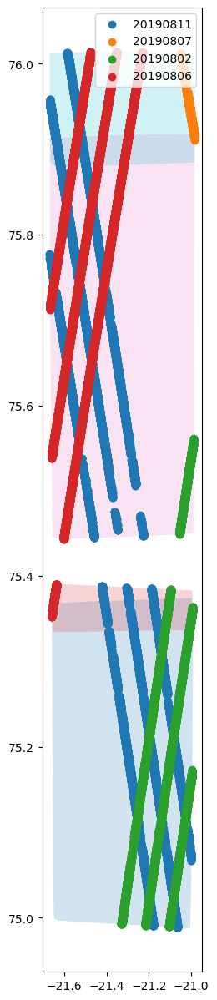

In [11]:
# Quick Check for Data
ax = outline.plot(column='seg_id', alpha=.2, lw=1, figsize=(15,15))
for shp in shp_files:
    gdf = gpd.read_file(f'{icesat2_path}/{shp}', parse_dates=True)
    lbl = shp.split('_')[2][:8] #pd.to_datetime(shp.split('_')[2][:8])
    gdf.plot(ax=ax, label=lbl)
plt.legend(loc=1);

In [12]:
# Pick the largest granule for quick visualization only
sz_list = [os.path.getsize(f'{icesat2_path}/{hdf}') for hdf in hdf_files]
idx = sz_list.index(max(sz_list)) #largest index
print('No of shp files',len(shp_files), len(hdf_files))
# print(outline.area)

fname = shp_files[idx].split('.shp')[0]

No of shp files 4 4


In [13]:
shp_files

['processed_ATL06_20190811020316_06720403_005_01.shp',
 'processed_ATL06_20190807021136_06110403_005_01.shp',
 'processed_ATL06_20190802153028_05430405_005_01.shp',
 'processed_ATL06_20190806152208_06040405_005_01.shp']

## Choose a corresponding DEM Strip for Analysis

Some metadata info about DEMs and Orthos
https://www.pgc.umn.edu/guides/arcticdem/data-description/#section-3  
_matchtag.tif – Bitmask raster indicating DEM pixels derived from a stereo match (1) or those that have been interpolated (0)
0 edge 1 1
1 water 1 0
2 cloud 1 0


In [14]:
dir_prefix

'/fs/byo/howat-data5'

In [15]:
## Now get the DEM (Rema for example)

# strip_version = ['v4', 'unf']
# strip_version = strip_version[0] #choose based on how folder names look

# strips_folder = f'{dir_prefix}/{dem_type}/{region}/strips_v4/2m' #f'{dir_prefix}/EarthDEM/{region}/strips_unf/2m' #for Alaska but not tried yet as ATL06 does not exist for this region
# strips = os.listdir(f'{strips_folder}') Done use this, use the ones got from icesat-2 listing

# strips_folder = f'' #f'{dir_prefix}/EarthDEM/{region}/strips_unf/2m' #for Alaska but not tried yet as ATL06 does not exist for this region
# dem_folder =    f'{strips_folder}/{strip}'
# dem_folder = f'{dir_prefix}/{REMA}/{region}/strips_unf/2m/{strip}'
dem_folder =    f'{dir_prefix}/{dem_type}/{region}/strips_v4.1/2m/{strip}'
tifs = [tif for tif in os.listdir(dem_folder) if tif.endswith('.tif')]
tifs

['SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg3_dem.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg3_ortho.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg1_dem.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg1_ortho.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg1_ortho2.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg4_dem.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg4_ortho.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg3_ortho2.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg2_dem.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg2_ortho.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg3_dem_10m.tif',
 'SETSM_s2s041_W1W2_20190802_102001008AA38100_1

In [16]:
outline#.name.values[0]#==outline.name.values[1]

,strip,version,seg_id,time1,time2,rmse,geometry
0,W1W2_20190802_102001008AA38100_1030010096CCE40...,v040310,1,2019-08-02 17:21:33,2019-08-07 13:41:34,1.032100,"POLYGON ((-21.48678 75.37026, -21.01337 75.374..."
1,W1W2_20190802_102001008AA38100_1030010096CCE40...,v040310,2,2019-08-02 17:21:32,2019-08-07 13:41:31,-1.000000,"POLYGON ((-20.99364 75.38133, -20.99382 75.340..."
2,W1W2_20190802_102001008AA38100_1030010096CCE40...,v040310,3,2019-08-02 17:21:29,2019-08-07 13:41:28,1.084429,"POLYGON ((-21.65830 75.48473, -21.66881 75.716..."
3,W1W2_20190802_102001008AA38100_1030010096CCE40...,v040310,4,2019-08-02 17:21:27,2019-08-07 13:41:25,-1.000000,"POLYGON ((-21.63979 75.87902, -21.66701 75.885..."


In [17]:
# Load ATL parsed data
# fname = 'processed_ATL06_20190319214810_12440205_003_01'#'processed_ATL06_20190303015545_09870205_002_01' # choose file overwriting previous choice
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.shp', parse_dates=True)
# Pick only the good quality data [verify if zero or one means good]
df = df[df.q_flag==0]
gdf = gdf[gdf.q_flag==0]
df = df.reset_index(drop=True)
gdf = gdf.reset_index(drop=True)
#Also reset index
gtls = list(df.strip.unique())
print(len(df), gtls)
# gv.tile_sources.ESRI * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=500, height=700, hover=['strip', 'h_te_media'])

18523 ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']


In [18]:
df.head()

,lon,lat,h_li,q_flag,t_dt,strip
0,-21.180516,74.990365,853.53784,0,2019-08-11 02:07:57.891,gt1l
1,-21.180625,74.990542,853.76420,0,2019-08-11 02:07:57.894,gt1l
2,-21.180733,74.990719,853.94520,0,2019-08-11 02:07:57.897,gt1l
3,-21.180840,74.990895,853.96826,0,2019-08-11 02:07:57.900,gt1l
4,-21.180943,74.991066,853.98710,0,2019-08-11 02:07:57.902,gt1l


In [19]:
# gv.tile_sources.ESRI * 
gdf.hvplot.points(geo=True, color='strip', tiles='ESRI', alpha=0.7, width=500, height=700, hover=['strip', 'h_li'])

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (strip)

In [20]:
gdf.head()

,t_dt,h_li,q_flag,strip,geometry
0,2019-08-11 02:07:57.891000,853.537842,0,gt1l,POINT (-21.18052 74.99037)
1,2019-08-11 02:07:57.894000,853.764221,0,gt1l,POINT (-21.18062 74.99054)
2,2019-08-11 02:07:57.897000,853.945190,0,gt1l,POINT (-21.18073 74.99072)
3,2019-08-11 02:07:57.900000,853.968262,0,gt1l,POINT (-21.18084 74.99090)
4,2019-08-11 02:07:57.902000,853.987122,0,gt1l,POINT (-21.18094 74.99107)


In [21]:
base = gv.tile_sources.ESRI
gtracks = gdf.hvplot.points(geo=True, color='strip', s=10, alpha=0.7, width=800, height=600)
terrain_scatter = df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters').relabel('Elevation') # by='strip', 
dem_outline = outline.hvplot(geo=True, color='seg_id', alpha=.3)
fig1 = base * dem_outline * gtracks + terrain_scatter
# hvplot.save(fig1, f'{analysis_folder}/test.png') #not working newly due to path for firefox or chromium; rather use html
fig1

:Layout
   .Overlay.I           :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .Polygons.I :Polygons   [Longitude,Latitude]   (seg_id)
      .Points.I   :Points   [Longitude,Latitude]   (strip)
   .NdOverlay.Elevation :NdOverlay   [strip]
      :Scatter   [h_li]   (lat)

In [22]:
# To Pick the DEM segment with most overlap IC02
# outline.crs, gdf.crs
# outline.hvplot(geo=True, color='seg_id', alpha=.4)

In [23]:
# outline.cx[:, :2]
# from earthpy import clip as cl : moved to geopandas and fixed here

In [24]:
# For a whole DEM outline, what is the intersection with specific icesat gt 
# seems not much difference
for fname in shp_files:
    gdf = gpd.read_file(f'{icesat2_path}/{fname}')
    print(f'{fname}: ') #{len(gdf)}
    for row in outline.iterrows():
        try:
            # Use DEM boundary to clip IS-2 shapefile
            clip = gpd.clip(gdf, gpd.GeoSeries(row[1]['geometry'], crs = outline.crs)) #crs required for both inputs
            print(f'\t{len(gdf)}: {len(clip)}')
        except:
            print(f'No Overlap {row[0]}')

processed_ATL06_20190811020316_06720403_005_01.shp: 
	23579: 10554
	23579: 1452
	23579: 11129
	23579: 2183
processed_ATL06_20190807021136_06110403_005_01.shp: 
	1009: 0
	1009: 0
	1009: 20
	1009: 1009
processed_ATL06_20190802153028_05430405_005_01.shp: 
	10956: 9633
	10956: 776
	10956: 1197
	10956: 0
processed_ATL06_20190806152208_06040405_005_01.shp: 
	14856: 131
	14856: 363
	14856: 11255
	14856: 4384


In [25]:
len(gdf), len(clip)

(14856, 4384)

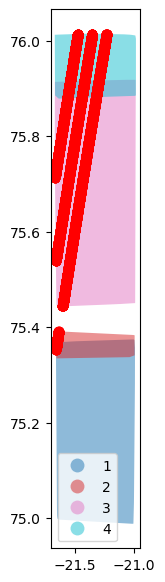

In [26]:
# gpd.GeoSeries(row[1]['geometry'])
ax = outline.plot(column='seg_id', categorical=True, alpha=.5, legend=True)
gdf.plot(ax=ax, c='r');

In [27]:
# Some dems has gaps in between segments, eg: /fs/byo/howat-data5/ArcticDEM/region_02_greenland_southeast/strips_v4/2m/W1W2_20190428_102001008466F300_1030010090702200_2m_lsf_v040002
# so icesat-2 will has gaps as well; to make it contineous 

In [28]:
# df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

In [29]:
# What is the time difference between Icesat and DEM
time_diff = pd.to_datetime(fname.split('_')[2]) - pd.to_datetime(strip.split('_')[1])
print(time_diff)

4 days 15:22:08


In [30]:
fname

'processed_ATL06_20190806152208_06040405_005_01.shp'

In [31]:
dem_folder

'/fs/byo/howat-data5/ArcticDEM/arcticdem_02_greenland_southeast/strips_v4.1/2m/W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_v040310'

In [32]:
# If there is more than one DEM, find a way to merge them into one seamless DEM
segments = [tif.split('_')[-2] for tif in os.listdir(dem_folder) if tif.endswith('_dem.tif')]
segments.sort() #This is inplace sorting
print(len(segments))
segments

4


['seg1', 'seg2', 'seg3', 'seg4']

In [33]:
strip

'W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_v040310'

In [34]:
# dem_tif = [tif.split('_seg')[0] for tif in os.listdir(dem_folder)] # if tif.endswith('_dem.tif')
'_'.join(strip.split('_')[:-1])

'W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf'

In [41]:
# Get full base path for all DEMs and Orthos and Matchtags
# Pick a segment : one or more
seg = segments[-1]
dem_prefix = '_'.join(strip.split('_')[:-1])
dem_prefix = f'{dem_folder}/SETSM_s2s041_{dem_prefix}_{seg}'  #TODO fix SETSM_s2s041_ prefix

dem = f'{dem_prefix}_dem.tif'
print(dem)
matchtag = f'{dem_prefix}_matchtag.tif'
bitmask = f'{dem_prefix}_bitmask.tif'
ortho = f'{dem_prefix}_ortho.tif'
shade = f'{dem_prefix}_dem_10m_shade.tif'

os.path.exists(dem), os.path.exists(matchtag), os.path.exists(bitmask), os.path.exists(ortho)

/fs/byo/howat-data5/ArcticDEM/arcticdem_02_greenland_southeast/strips_v4.1/2m/W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_v040310/SETSM_s2s041_W1W2_20190802_102001008AA38100_1030010096CCE400_2m_lsf_seg4_dem.tif


(True, True, True, True)

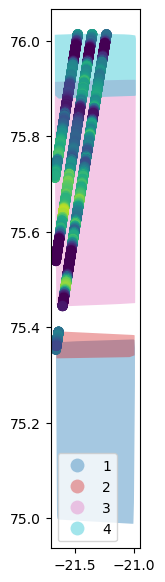

In [42]:
# Overview of how ground-tracks intersect with DEM outline
ax = outline.plot(column='seg_id', alpha=.4, categorical=True, legend=True)
# outline[outline.seg_id==int(seg.strip('seg'))].plot(ax=ax, color='r')
gdf.plot(ax=ax, column='h_li');

## Use Xarray load and analyze DEM

In [43]:
dem = rioxarray.open_rasterio(dem) #, chunks={'x':2**11, 'y':2**11}
dem = dem.load()
# da = xr.open_rasterio(f'{dem_folder}/{ortho_tif}')

In [44]:
dem

<xarray.DataArray (band: 1, y: 10125, x: 11174)>
array([[[-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        ...,
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.]]],
      dtype=float32)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 6.03e+05 6.03e+05 6.03e+05 ... 6.253e+05 6.253e+05
  * y            (y) float64 -1.391e+06 -1.391e+06 ... -1.411e+06 -1.411e+06
    spatial_ref  int64 0
Attributes:
    _FillValue:    -9999.0
    scale_factor:  1.0
    add_offset:    0.0

In [49]:
# dem.rio.nodata == dem.attrs["_FillValue"]

True

In [48]:
dem.attrs["_FillValue"]

TypeError: 'float' object is not subscriptable

In [50]:
# nodata_value = dem.attrs['nodatavals'][0] for xarray
nodata_value = dem.rio.nodata # or this one also works dem.attrs["_FillValue"] #for rioxarray
nodata_value

-9999.0

In [51]:
dem.data[dem.data==nodata_value] = np.nan # dem.datareplace no-data with NANs
print(nodata_value)

-9999.0


In [52]:
# dem.sel(band=1).plot.imshow(cmap='viridis', robust=True);

In [53]:
# matchtag = xr.open_rasterio(matchtag)
# rioxarray.open_rasterio
bitmask = rioxarray.open_rasterio(bitmask)

In [54]:
shade = rioxarray.open_rasterio(shade)

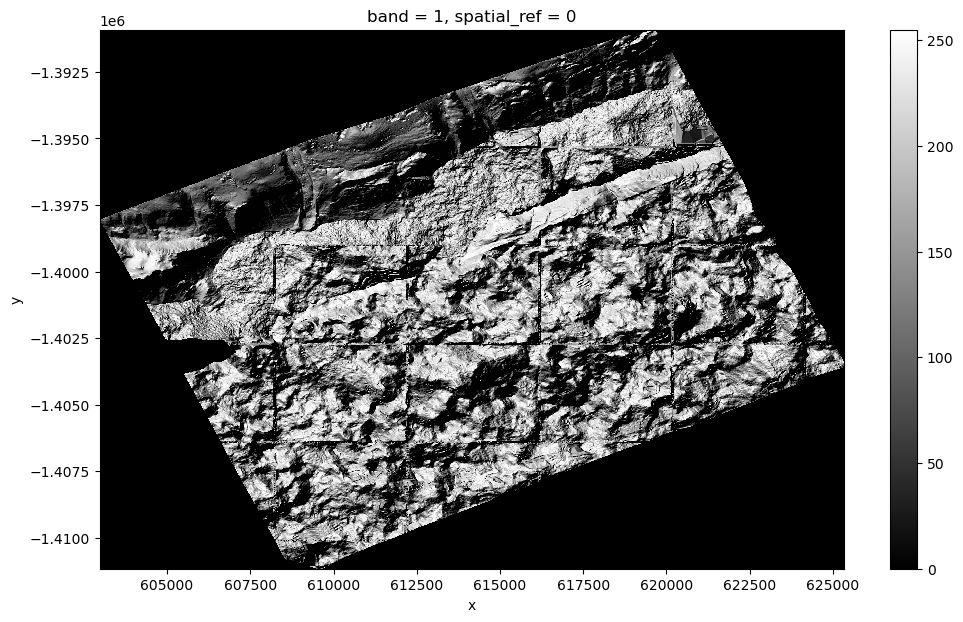

In [55]:
shade.sel(band=1).plot.imshow(cmap='gray');

In [56]:
# Mask out problematic DEM values based matchtag mask [remove value = 0 or keep value == 1]; ie, put NANs whereever matchtag NOT == 1
# dem = dem.where(matchtag.data==1)
dem = dem.where(bitmask.data==0)
# matchtag.sel(band=1).plot.imshow();
# dem.sel(band=1).plot.imshow(cmap='viridis', robust=True)

In [57]:
asp = dem.x.size/dem.y.size
asp

1.1036049382716049

In [58]:
dem.hvplot.image(rasterize=True, cmap='gist_earth', frame_width=int(700*asp), aspect=asp)

:DynamicMap   [band]
   :Image   [y,x]   (value)

In [59]:
bitmask.shape

(1, 10125, 11174)

In [60]:
dem.shape

(1, 10125, 11174)

In [62]:
# bitmask.sel(band=1).plot.imshow(robust=True);
bitmask.hvplot.image(rasterize=True, cmap='gray', frame_width=int(500*asp), aspect=asp, x="x", y="y")

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [63]:
# gv.from_xarray(dem) #crashed jupyter; try on smaller data

In [65]:
dem.rio.crs

CRS.from_epsg(3413)

In [66]:
# Change Icesat shapefile projection to match DEM's projection
# Else can't extract elevation from DEM
# Required to overlay plots as well
proj4 = dem.rio.crs #dem.crs #dem.projection.ExportToProj4() # but there is extra space at the end
gdf1 = gdf.to_crs(proj4).copy()
# gdf1.iloc[1].geometry.x, gdf1.iloc[1].geometry.y

In [67]:
len(gdf1)

14856

In [68]:
gdf1

,t_dt,h_li,q_flag,strip,geometry
0,2019-08-06 15:23:49.146000,557.838501,0,gt1l,POINT (613609.795 -1393226.454)
1,2019-08-06 15:23:49.148000,558.850891,0,gt1l,POINT (613614.698 -1393245.533)
2,2019-08-06 15:23:49.151000,561.976929,0,gt1l,POINT (613619.581 -1393264.617)
3,2019-08-06 15:23:49.154000,563.282654,0,gt1l,POINT (613624.466 -1393283.701)
4,2019-08-06 15:23:49.157000,562.379883,0,gt1l,POINT (613629.354 -1393302.784)
...,...,...,...,...,...
14851,2019-08-06 15:23:54.320000,1082.157593,0,gt3r,POINT (615825.673 -1427754.801)
14852,2019-08-06 15:23:54.323000,1084.352051,0,gt3r,POINT (615830.566 -1427773.893)
14853,2019-08-06 15:23:54.325000,1086.614014,0,gt3r,POINT (615835.485 -1427792.978)
14854,2019-08-06 15:23:54.328000,1089.169434,0,gt3r,POINT (615840.423 -1427812.059)


## Extraction pixel value from raster for each point

In [69]:
def getPixVal(pt):
    """ Given a Geopandas/Shapely Point geometry, extract the pixel value from the Xarray raster """
    #x, y = pt.coords[:][0]
    out = dem.sel(x = pt.x, y=pt.y, method='nearest')
    return out.values[0]

In [70]:
gdf1['dem'] = gdf1.geometry.apply(getPixVal)

In [71]:
nan_count = len(gdf1[np.isnan(gdf1.dem)])
print(nan_count)
print('Nans Fraction: ', nan_count/len(gdf1))

14668
Nans Fraction:  0.9873451803984922


In [72]:
gdf1 = gdf1.dropna() #Drop the Nans from the edges of DEM
gdf1['dif'] = gdf1.h_li - gdf1.dem
gdf1 = gdf1.drop(['t_dt', 'q_flag'], axis=1)

/home/yadav.111/miniconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [73]:
len(gdf1), len(gdf)

(188, 14856)

In [74]:
gdf1.strip.value_counts()

gt2l    77
gt2r    51
gt1l    37
gt1r    19
gt3l     3
gt3r     1
Name: strip, dtype: int64

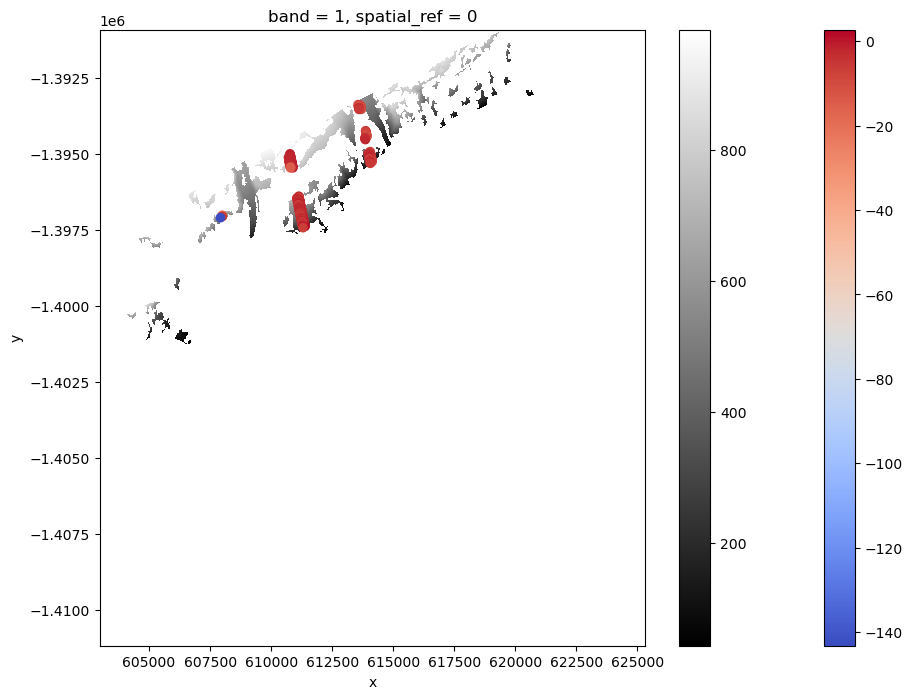

In [75]:
# da.plot.imshow(cmap='gist_earth')
ax = gdf1.plot(column='dif', cmap='coolwarm', legend=True, figsize=(11, 8))
# ax = gdf1.plot(column='dif', legend=True, figsize=(11, 8))
dem.sel(band=1).plot.imshow(ax=ax, cmap='gray');

In [76]:
dem.hvplot.image(cmap='gray', rasterize=True)

:DynamicMap   [band]
   :Image   [y,x]   (value)

In [77]:
base * gdf1.hvplot(geo=True, crs=ccrs.NorthPolarStereo(central_longitude=-45), frame_width=500)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]

In [78]:
gdf1.tail(2)

,h_li,strip,geometry,dem,dif
11674,599.180115,gt3l,POINT (608001.392 -1397053.721),605.234375,-6.054260
13370,469.013550,gt3r,POINT (607921.360 -1397094.718),612.273438,-143.259888


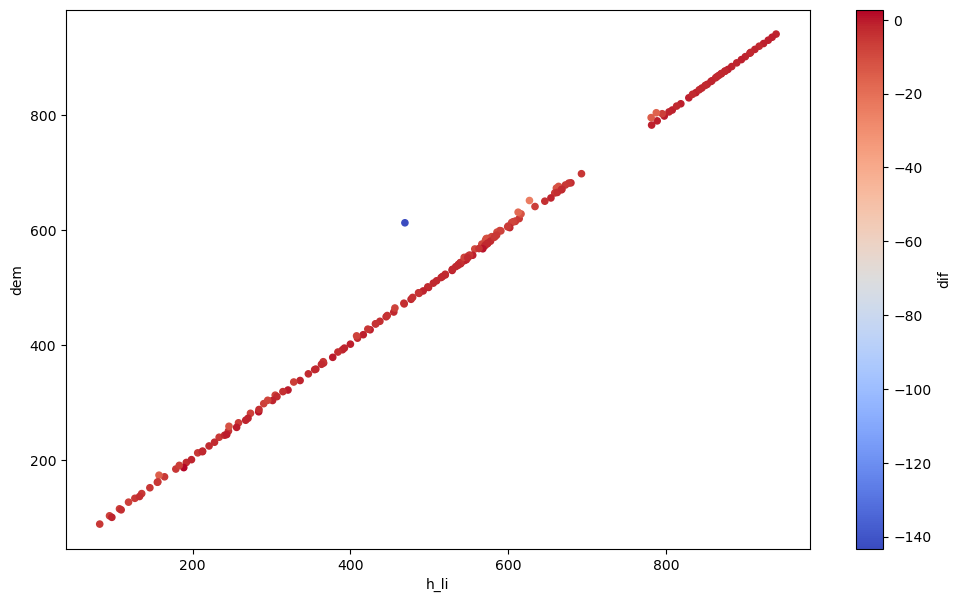

In [79]:
gdf1[['h_li','dem', 'dif']].plot(kind='scatter', x=0, y=1, c='dif', cmap='coolwarm');

<AxesSubplot:>

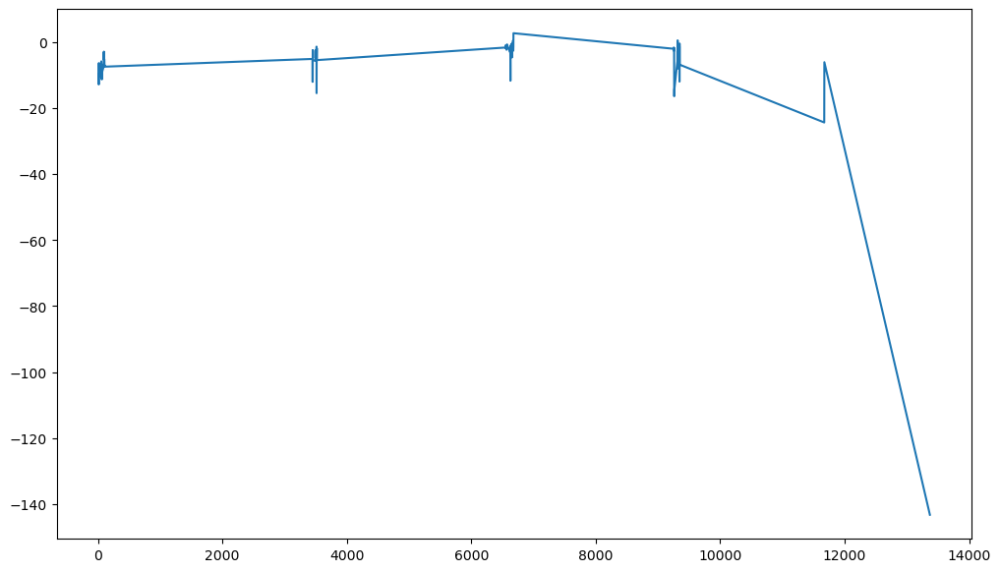

In [80]:
gdf1.dif.plot()

In [81]:
# df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

In [82]:
# gdf1[['h_li','dem']].hvplot(kind='scatter', x=0, y=1);
gdf1[['h_li','dem', 'strip']].hvplot(y='dem', x='h_li', kind='scatter', by='strip', subplots=False)

:NdOverlay   [strip]
   :Scatter   [h_li]   (dem)

In [85]:
gdf1[gdf1.strip=='gt2r'][['h_li','dem']].hvplot(kind='scatter', alpha=.5)

:NdOverlay   [Variable]
   :Scatter   [index]   (value)

In [86]:
gdf1.strip.value_counts()

gt2l    77
gt2r    51
gt1l    37
gt1r    19
gt3l     3
gt3r     1
Name: strip, dtype: int64

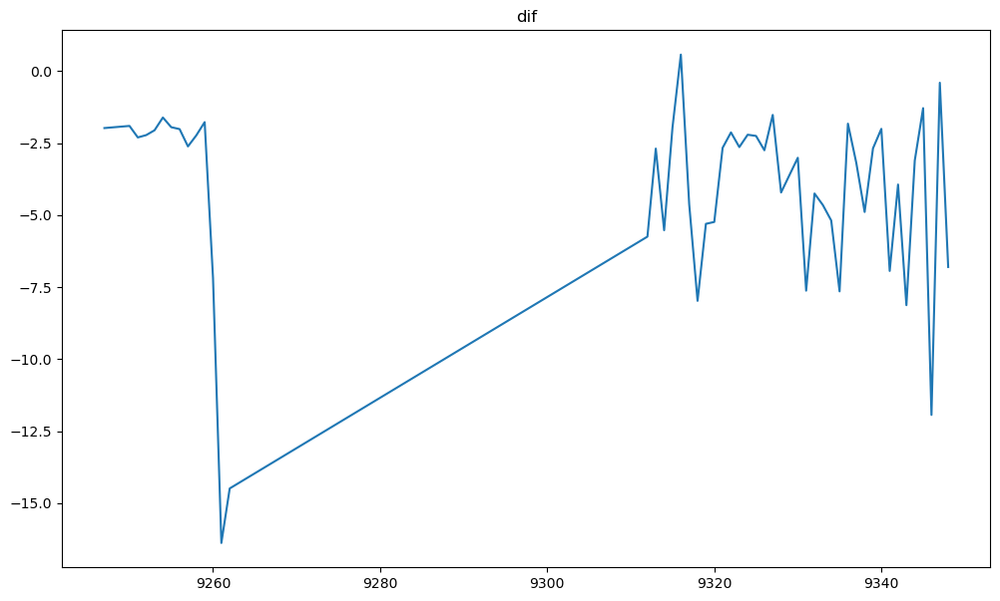

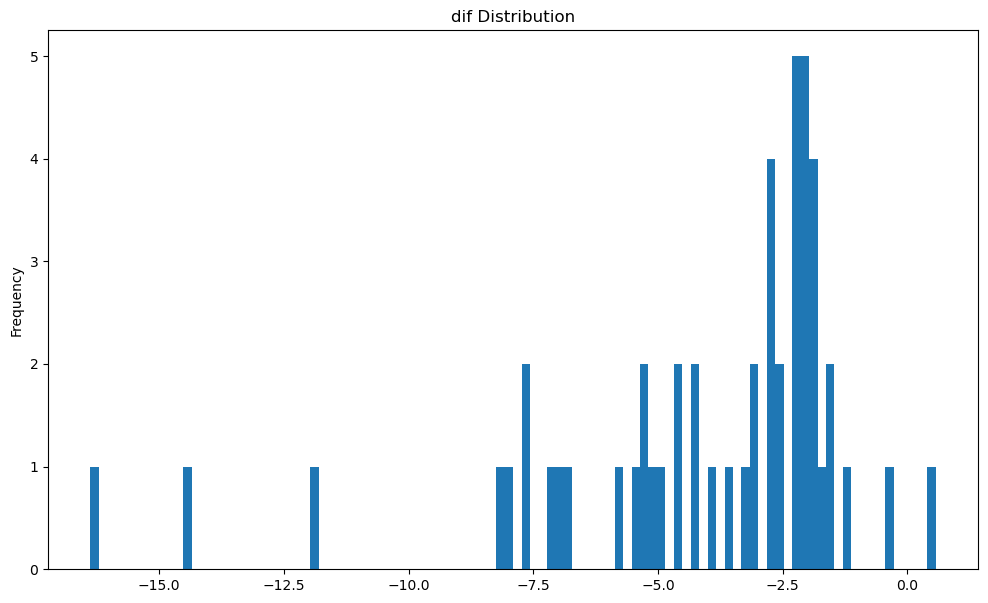

In [88]:
gdf1[gdf1.strip=='gt2r'].dif.plot(title='dif')
plt.figure()
gdf1[gdf1.strip=='gt2r'].dif.plot(kind='hist', bins=100, title='dif Distribution');

In [89]:
# ortho_tif
ortho = rioxarray.open_rasterio(ortho)#.load()
# nodata_value = ortho.attrs['nodatavals'][0]
# # First conver to fload, so it can be converted to nan
# ortho.data = ortho.data.astype(float)

# ortho.data[ortho.data==nodata_value] = np.nan
# print(nodata_value)

In [90]:
np.nanmax(ortho.data)

2001

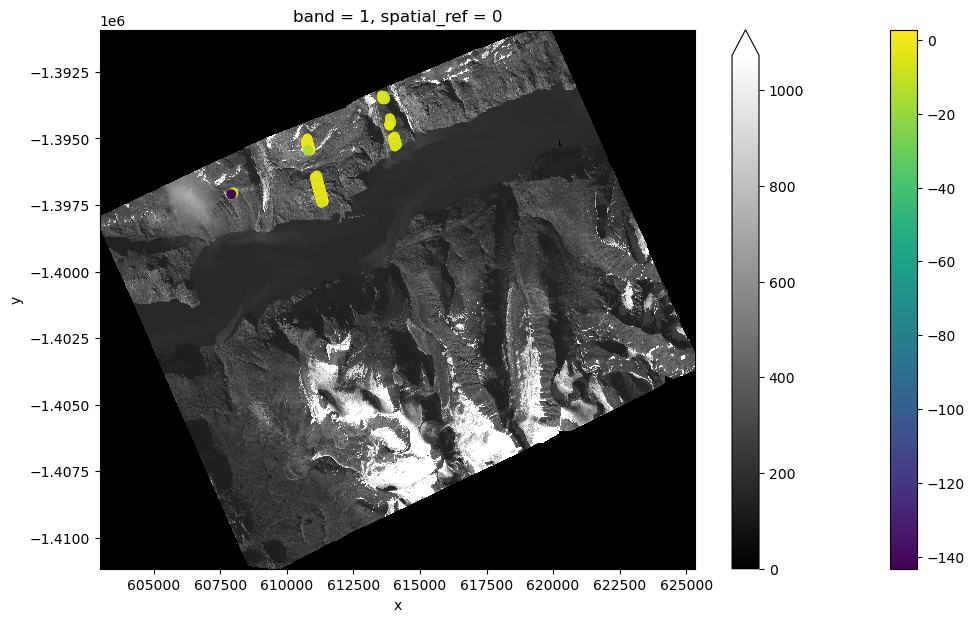

In [91]:
ax = gdf1.plot(column='dif', legend=True)
ortho.sel(band=1).plot.imshow(ax=ax, robust=True, cmap='gray'); #, cmap='gist_earth'

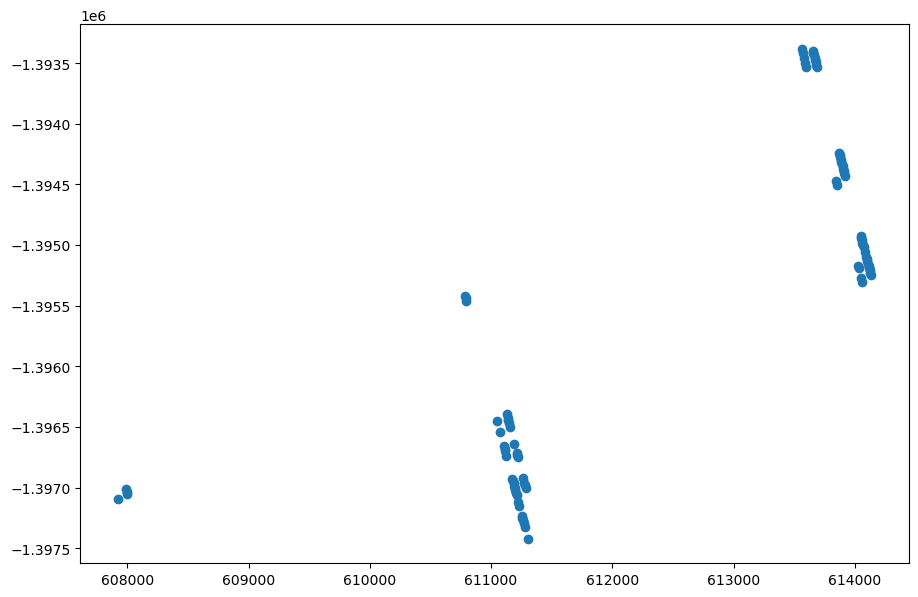

In [92]:
gdf1[np.abs(gdf1.dif)>3].plot();

In [93]:
# gdf2 = gdf1.reset_index(drop = True)

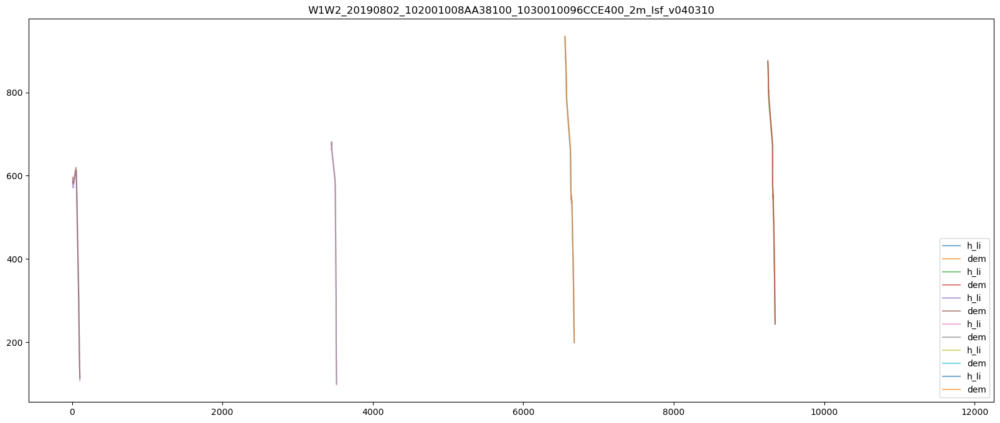

In [97]:
gtls = list(gdf1.strip.value_counts().index) #['gt1l', 'gt1r','gt2l', 'gt2r', 'gt3l','gt3r']
# gtl = gtls[2]
fig, ax = plt.subplots(figsize=(20, 8))
for gtl in gtls:
    gdf1[gdf1.strip==gtl][['h_li', 'dem']].iloc[1:-1].plot(style='-', alpha=.6, title=strip, ax=ax);

In [98]:
gtls

['gt2l', 'gt2r', 'gt1l', 'gt1r', 'gt3l', 'gt3r']

In [101]:
gtl = gtls[1]
gtl

'gt2r'

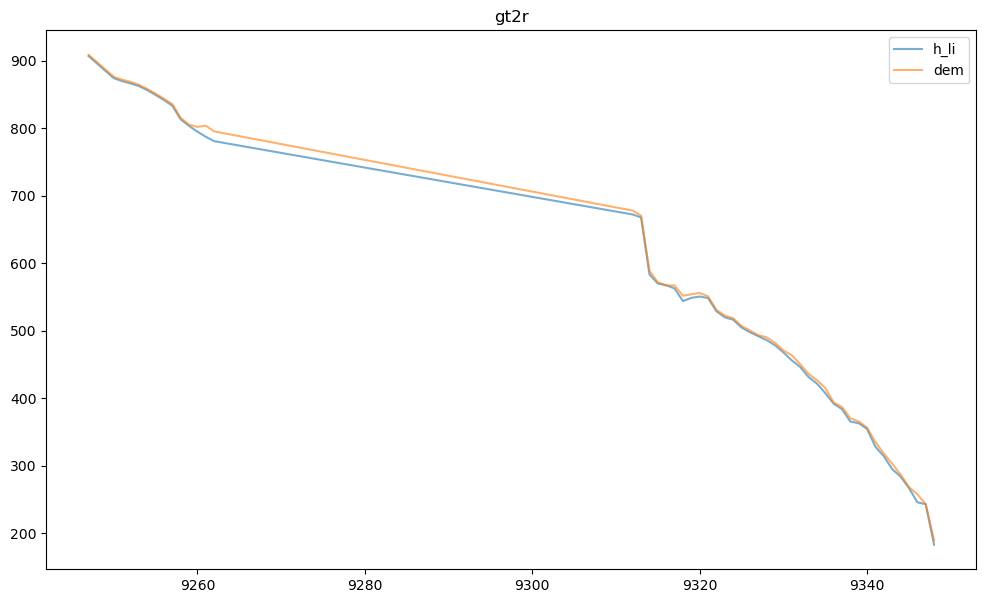

In [102]:
gdf1[gdf1.strip==gtl][['h_li', 'dem']].plot(style='-', alpha=.6, title=gtl);

In [103]:
# gdf1[gdf1.strip==gtl].reset_index()[['h_li', 'dem']].plot(style='-', alpha=.6, title=gtl);

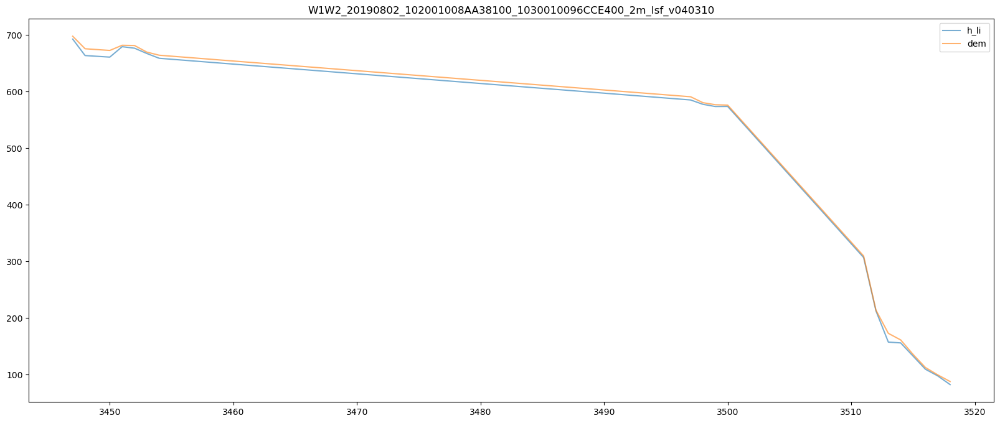

In [104]:
# gdf[['h_li', 'dem']].plot()
fig, ax = plt.subplots(figsize=(20, 8))
# gdf2[gdf2.strip=='gt1l'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax
gdf1[gdf1.strip==gtls[3]][['h_li', 'dem']].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax

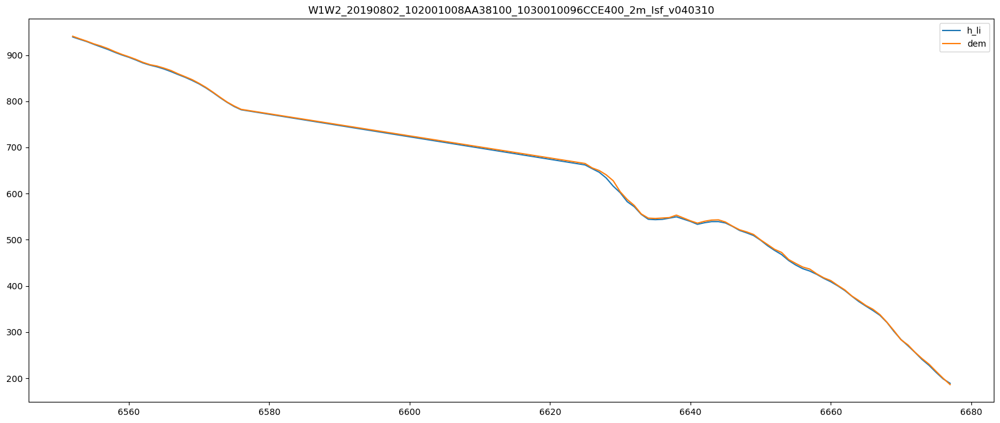

In [105]:
fig, ax = plt.subplots(figsize=(20, 8))
# gdf1[gdf1.strip==gtls[0]][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', title=strip, ax=ax); #, ax=ax
gdf1[gdf1.strip==gtls[0]][['h_li', 'dem']].plot(style='-', title=strip, ax=ax); #, ax=ax

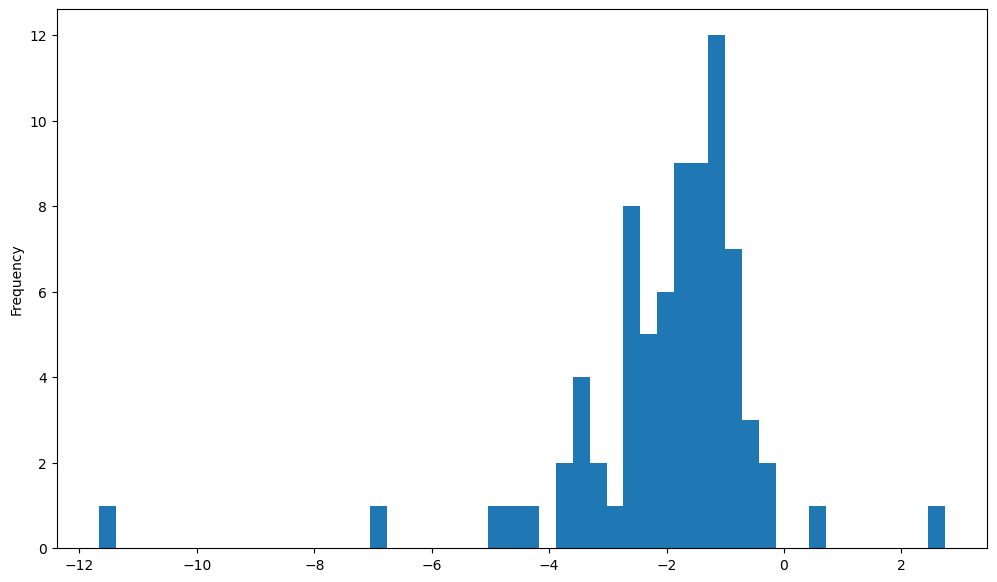

In [106]:
gdf1[gdf1.strip==gtls[0]].dif.plot(kind='hist', bins=50);

In [107]:
time_diff

Timedelta('4 days 15:22:08')

In [108]:
fname

'processed_ATL06_20190806152208_06040405_005_01.shp'

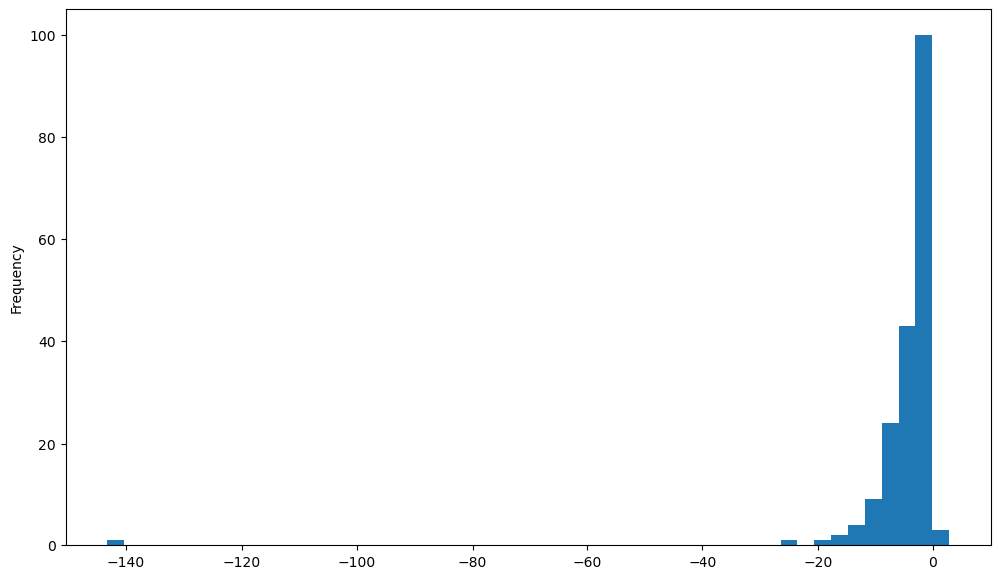

In [109]:
gdf1.dif.plot(kind='hist', bins=50);

In [110]:
gdf1.dif.mean()

-4.90025820630662

In [111]:
dfg = gdf1.groupby('strip')

In [112]:
type(dfg)

pandas.core.groupby.generic.DataFrameGroupBy

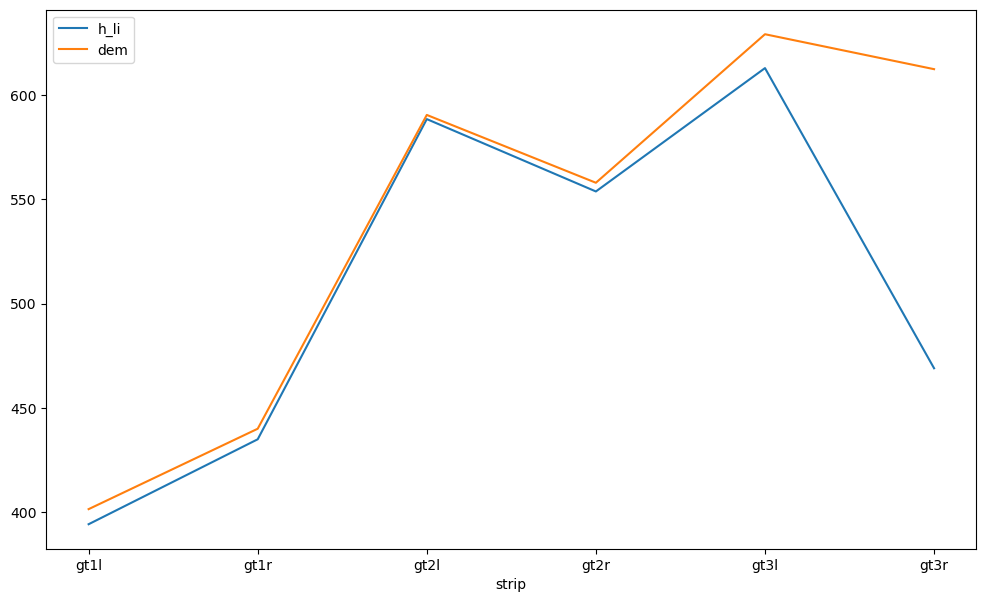

In [113]:
# dfg.dif.mean().plot(kind='bar');
pd.DataFrame(dfg[['h_li', 'dem']].mean()).plot();

In [114]:
# gtl = 'gt2'
# ax = gdf1[gdf1.strip==f'{gtl}l'][['dem','h_li']].plot(lw=4, alpha=.5)
# gdf2[gdf2.strip==f'{gtl}r'][['h_li', 'dem']].plot(ax = ax)